# Learning Functions Part 2

In this notebook we'll extend the task of adding two numbers over sequences. Given ([1,2,3], [4,5,6]) the recurrent network should learn to add each pair of numbers and keep track of the result:

```
1 + 4 = 5
2 + 5 + 5 = 12
6 + 3 + 12 = 21
```

In [1]:
# Load environment
using Pkg
Pkg.activate("..")

"/Users/domluna/github/NeuralArithmetic/Project.toml"

In [2]:
using NeuralArithmetic
using Flux
using Plots
import Distributions: Uniform

In [6]:
# number of training set examples
N = 500

500

The dataset of a function will contain `N` training examples, 50 validation examples (interpolation), and 50 testing examples (extrapolation).

In [9]:
dist = Uniform(1, 10)
# N sequences of length 1 to 10
train_seqs = [rand(dist, 2, 10) for _ in 1:N]
# (interpolation)
val_seqs = [rand(dist, 2, 10) for _ in 1:50]
# (extrapolation) sequences longer than shown
test_seqs = [rand(dist, 2, 1000) for _ in 1:50]

50-element Array{Array{Float64,2},1}:
 [3.86635 9.18616 … 1.10189 1.75157; 9.45124 8.87546 … 9.22375 6.60662]
 [8.29319 1.9944 … 2.96347 1.91687; 6.66607 8.67627 … 1.66988 8.21862] 
 [3.66164 2.37191 … 7.96126 9.40529; 4.85395 1.78914 … 8.27528 1.00996]
 [3.67538 5.20048 … 8.53276 7.0635; 8.26744 3.11587 … 2.04758 1.62971] 
 [9.47743 9.87287 … 6.16014 8.09592; 1.90317 9.64163 … 1.7672 2.84257] 
 [5.50132 1.58818 … 1.59779 4.3138; 6.19429 2.81538 … 7.24919 5.48369] 
 [6.44303 8.97044 … 5.35093 6.56285; 1.09406 1.43811 … 5.10627 9.91262]
 [1.8025 9.4343 … 5.96642 8.5369; 6.81897 3.0777 … 2.17729 9.95208]    
 [1.0646 1.2963 … 7.71302 9.68043; 2.95478 3.70916 … 2.31423 6.52778]  
 [3.72754 1.62942 … 6.99173 9.72696; 9.02657 7.99378 … 5.49593 7.76127]
 [4.54278 8.76488 … 3.45214 6.66042; 7.47776 1.84701 … 1.74892 5.8946] 
 [4.56468 7.03596 … 6.05108 6.89543; 1.80384 5.36963 … 2.17252 3.19263]
 [6.38286 8.62775 … 9.59127 9.14754; 1.36496 9.943 … 1.41463 4.84315]  
 ⋮                        

In [56]:
function f(m, x)
    state = m[1].(x)[end]
    # reset hidden state of recurrent node on each sequence
    Flux.reset!(m[1])
    m[2:end](state)
end

loss(f, m) = (x, y) -> Flux.mse(f(m, x), y)

function train_model(lossf, opt, train_data, val_data, epochs::Int)
    hist = zeros(epochs)
    for i in 1:epochs
        Flux.train!(lossf, train_data, opt) 
        val_loss = Flux.data(sum(lossf(d...) for d in val_data))
        @info "Iteration $i - Validation loss = $val_loss"
        hist[i] = val_loss
    end
    return hist
end

train_model (generic function with 2 methods)

Let's run the experiments and plot results.

In [38]:
epochs = 500

500

### `+` Data

In [39]:
add_data_train = [(s, sum(reduce(+, s, dims=1))) for s in train_seqs]
add_data_val = [(s, sum(reduce(+, s, dims=1))) for s in val_seqs]
add_data_test = [(s, sum(reduce(+, s, dims=1))) for s in test_seqs]

50-element Array{Tuple{Array{Float64,2},Float64},1}:
 ([3.86635 9.18616 … 1.10189 1.75157; 9.45124 8.87546 … 9.22375 6.60662], 10910.888269339148)
 ([8.29319 1.9944 … 2.96347 1.91687; 6.66607 8.67627 … 1.66988 8.21862], 11200.117676702906) 
 ([3.66164 2.37191 … 7.96126 9.40529; 4.85395 1.78914 … 8.27528 1.00996], 11078.656221983492)
 ([3.67538 5.20048 … 8.53276 7.0635; 8.26744 3.11587 … 2.04758 1.62971], 10872.72253634945)  
 ([9.47743 9.87287 … 6.16014 8.09592; 1.90317 9.64163 … 1.7672 2.84257], 11023.468563775867) 
 ([5.50132 1.58818 … 1.59779 4.3138; 6.19429 2.81538 … 7.24919 5.48369], 11080.540423049417) 
 ([6.44303 8.97044 … 5.35093 6.56285; 1.09406 1.43811 … 5.10627 9.91262], 10909.943236151084)
 ([1.8025 9.4343 … 5.96642 8.5369; 6.81897 3.0777 … 2.17729 9.95208], 10988.856565174894)    
 ([1.0646 1.2963 … 7.71302 9.68043; 2.95478 3.70916 … 2.31423 6.52778], 11018.6332600833)    
 ([3.72754 1.62942 … 6.99173 9.72696; 9.02657 7.99378 … 5.49593 7.76127], 10842.21628462486) 
 ([4.54

## `LSTM + Dense`

┌ Info: Iteration 1 - Validation loss = 1.2234807366491049e6
└ @ Main In[56]:15
┌ Info: Iteration 2 - Validation loss = 1.1774775955683878e6
└ @ Main In[56]:15
┌ Info: Iteration 3 - Validation loss = 1.1418587062974784e6
└ @ Main In[56]:15
┌ Info: Iteration 4 - Validation loss = 1.1091476034096205e6
└ @ Main In[56]:15
┌ Info: Iteration 5 - Validation loss = 1.0778378779885122e6
└ @ Main In[56]:15
┌ Info: Iteration 6 - Validation loss = 1.0474559396873745e6
└ @ Main In[56]:15
┌ Info: Iteration 7 - Validation loss = 1.0177891717214689e6
└ @ Main In[56]:15
┌ Info: Iteration 8 - Validation loss = 988725.7655165119
└ @ Main In[56]:15
┌ Info: Iteration 9 - Validation loss = 960201.7101695865
└ @ Main In[56]:15
┌ Info: Iteration 10 - Validation loss = 932178.5240611151
└ @ Main In[56]:15
┌ Info: Iteration 11 - Validation loss = 904632.3784769898
└ @ Main In[56]:15
┌ Info: Iteration 12 - Validation loss = 877548.2308479657
└ @ Main In[56]:15
┌ Info: Iteration 13 - Validation loss = 850916.4481

┌ Info: Iteration 107 - Validation loss = 10276.170975446103
└ @ Main In[56]:15
┌ Info: Iteration 108 - Validation loss = 9555.931477362898
└ @ Main In[56]:15
┌ Info: Iteration 109 - Validation loss = 8767.265091663276
└ @ Main In[56]:15
┌ Info: Iteration 110 - Validation loss = 7880.164046821374
└ @ Main In[56]:15
┌ Info: Iteration 111 - Validation loss = 6896.383188588271
└ @ Main In[56]:15
┌ Info: Iteration 112 - Validation loss = 6627.619678843583
└ @ Main In[56]:15
┌ Info: Iteration 113 - Validation loss = 6232.519645245379
└ @ Main In[56]:15
┌ Info: Iteration 114 - Validation loss = 5949.640760686179
└ @ Main In[56]:15
┌ Info: Iteration 115 - Validation loss = 5431.413638581866
└ @ Main In[56]:15
┌ Info: Iteration 116 - Validation loss = 5004.615400830102
└ @ Main In[56]:15
┌ Info: Iteration 117 - Validation loss = 4694.3047657364905
└ @ Main In[56]:15
┌ Info: Iteration 118 - Validation loss = 4471.7027600493275
└ @ Main In[56]:15
┌ Info: Iteration 119 - Validation loss = 4278.24

┌ Info: Iteration 211 - Validation loss = 117.29915897706492
└ @ Main In[56]:15
┌ Info: Iteration 212 - Validation loss = 114.58673353851748
└ @ Main In[56]:15
┌ Info: Iteration 213 - Validation loss = 111.95290388800865
└ @ Main In[56]:15
┌ Info: Iteration 214 - Validation loss = 109.39467409377595
└ @ Main In[56]:15
┌ Info: Iteration 215 - Validation loss = 106.9092017657032
└ @ Main In[56]:15
┌ Info: Iteration 216 - Validation loss = 104.49379897657657
└ @ Main In[56]:15
┌ Info: Iteration 217 - Validation loss = 102.14593435774756
└ @ Main In[56]:15
┌ Info: Iteration 218 - Validation loss = 99.86323539440792
└ @ Main In[56]:15
┌ Info: Iteration 219 - Validation loss = 97.64349001377398
└ @ Main In[56]:15
┌ Info: Iteration 220 - Validation loss = 95.48464669304738
└ @ Main In[56]:15
┌ Info: Iteration 221 - Validation loss = 93.3848124973526
└ @ Main In[56]:15
┌ Info: Iteration 222 - Validation loss = 91.34224867308926
└ @ Main In[56]:15
┌ Info: Iteration 223 - Validation loss = 89.35

┌ Info: Iteration 317 - Validation loss = 30.778056920367355
└ @ Main In[56]:15
┌ Info: Iteration 318 - Validation loss = 30.659760053561712
└ @ Main In[56]:15
┌ Info: Iteration 319 - Validation loss = 30.543647215378268
└ @ Main In[56]:15
┌ Info: Iteration 320 - Validation loss = 30.42968017554741
└ @ Main In[56]:15
┌ Info: Iteration 321 - Validation loss = 30.317823381794625
└ @ Main In[56]:15
┌ Info: Iteration 322 - Validation loss = 30.20804376253795
└ @ Main In[56]:15
┌ Info: Iteration 323 - Validation loss = 30.100310543674116
└ @ Main In[56]:15
┌ Info: Iteration 324 - Validation loss = 29.99459507854025
└ @ Main In[56]:15
┌ Info: Iteration 325 - Validation loss = 29.890870690170253
└ @ Main In[56]:15
┌ Info: Iteration 326 - Validation loss = 29.78911252484661
└ @ Main In[56]:15
┌ Info: Iteration 327 - Validation loss = 29.689297416114922
└ @ Main In[56]:15
┌ Info: Iteration 328 - Validation loss = 29.591403758422903
└ @ Main In[56]:15
┌ Info: Iteration 329 - Validation loss = 29

┌ Info: Iteration 423 - Validation loss = 27.099216679729825
└ @ Main In[56]:15
┌ Info: Iteration 424 - Validation loss = 27.115055146453713
└ @ Main In[56]:15
┌ Info: Iteration 425 - Validation loss = 27.130912694207748
└ @ Main In[56]:15
┌ Info: Iteration 426 - Validation loss = 27.14676425690871
└ @ Main In[56]:15
┌ Info: Iteration 427 - Validation loss = 27.162585394262752
└ @ Main In[56]:15
┌ Info: Iteration 428 - Validation loss = 27.178352312083522
└ @ Main In[56]:15
┌ Info: Iteration 429 - Validation loss = 27.194041881061892
└ @ Main In[56]:15
┌ Info: Iteration 430 - Validation loss = 27.209631653886373
└ @ Main In[56]:15
┌ Info: Iteration 431 - Validation loss = 27.22509988077194
└ @ Main In[56]:15
┌ Info: Iteration 432 - Validation loss = 27.240425523298992
└ @ Main In[56]:15
┌ Info: Iteration 433 - Validation loss = 27.255588266644317
└ @ Main In[56]:15
┌ Info: Iteration 434 - Validation loss = 27.27056853011615
└ @ Main In[56]:15
┌ Info: Iteration 435 - Validation loss = 2

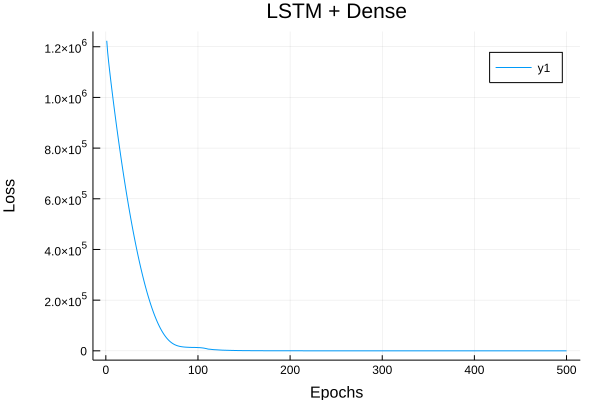

In [57]:
lstm = Chain(LSTM(2, 2), Dense(2, 1))
lstm_opt = ADAM(params(lstm))
lstm_loss = loss(f, lstm)
hist = train_model(lstm_loss, lstm_opt, add_data_train, add_data_val, epochs)
@info "Validation loss", hist[end]
@info "Test loss", sum(lstm_loss(d...) for d in add_data_test) |> Flux.data
plot(hist, title="LSTM + Dense", xlabel="Epochs", ylabel="Loss")

## `RNAC`

┌ Info: Iteration 1 - Validation loss = 180848.09170594762
└ @ Main In[56]:15
┌ Info: Iteration 2 - Validation loss = 6524.645709284961
└ @ Main In[56]:15
┌ Info: Iteration 3 - Validation loss = 974.0791231201579
└ @ Main In[56]:15
┌ Info: Iteration 4 - Validation loss = 654.4595156775994
└ @ Main In[56]:15
┌ Info: Iteration 5 - Validation loss = 622.3172514513318
└ @ Main In[56]:15
┌ Info: Iteration 6 - Validation loss = 605.1641285357706
└ @ Main In[56]:15
┌ Info: Iteration 7 - Validation loss = 585.6870176802752
└ @ Main In[56]:15
┌ Info: Iteration 8 - Validation loss = 563.2174846144821
└ @ Main In[56]:15
┌ Info: Iteration 9 - Validation loss = 537.854649287562
└ @ Main In[56]:15
┌ Info: Iteration 10 - Validation loss = 509.91886518062915
└ @ Main In[56]:15
┌ Info: Iteration 11 - Validation loss = 479.90698819032775
└ @ Main In[56]:15
┌ Info: Iteration 12 - Validation loss = 448.4034811350748
└ @ Main In[56]:15
┌ Info: Iteration 13 - Validation loss = 416.0090618442557
└ @ Main In[

┌ Info: Iteration 103 - Validation loss = 1.3914244190650295e-25
└ @ Main In[56]:15
┌ Info: Iteration 104 - Validation loss = 7.059913826719066e-24
└ @ Main In[56]:15
┌ Info: Iteration 105 - Validation loss = 2.043411312082015e-16
└ @ Main In[56]:15
┌ Info: Iteration 106 - Validation loss = 0.0005445627151072364
└ @ Main In[56]:15
┌ Info: Iteration 107 - Validation loss = 4.755587338880473e-15
└ @ Main In[56]:15
┌ Info: Iteration 108 - Validation loss = 1.1641430958416367e-17
└ @ Main In[56]:15
┌ Info: Iteration 109 - Validation loss = 7.249909978252739e-10
└ @ Main In[56]:15
┌ Info: Iteration 110 - Validation loss = 0.00021642241568157913
└ @ Main In[56]:15
┌ Info: Iteration 111 - Validation loss = 1.0468424145060827e-7
└ @ Main In[56]:15
┌ Info: Iteration 112 - Validation loss = 2.8628320916074572e-12
└ @ Main In[56]:15
┌ Info: Iteration 113 - Validation loss = 1.6729188377538753e-10
└ @ Main In[56]:15
┌ Info: Iteration 114 - Validation loss = 0.03946728316250164
└ @ Main In[56]:15
┌

┌ Info: Iteration 203 - Validation loss = 2.402713925141196e-10
└ @ Main In[56]:15
┌ Info: Iteration 204 - Validation loss = 0.00032337780931119295
└ @ Main In[56]:15
┌ Info: Iteration 205 - Validation loss = 1.8598169784376564e-7
└ @ Main In[56]:15
┌ Info: Iteration 206 - Validation loss = 0.00221666913848204
└ @ Main In[56]:15
┌ Info: Iteration 207 - Validation loss = 1.0043935692966677e-6
└ @ Main In[56]:15
┌ Info: Iteration 208 - Validation loss = 1.1691452163026363e-19
└ @ Main In[56]:15
┌ Info: Iteration 209 - Validation loss = 9.222579153826091e-24
└ @ Main In[56]:15
┌ Info: Iteration 210 - Validation loss = 2.832790574432319e-20
└ @ Main In[56]:15
┌ Info: Iteration 211 - Validation loss = 0.49541216173205954
└ @ Main In[56]:15
┌ Info: Iteration 212 - Validation loss = 1.1021511763330811e-8
└ @ Main In[56]:15
┌ Info: Iteration 213 - Validation loss = 6.994953292199314e-6
└ @ Main In[56]:15
┌ Info: Iteration 214 - Validation loss = 8.437135076900489e-5
└ @ Main In[56]:15
┌ Info: 

┌ Info: Iteration 303 - Validation loss = 0.03748484598691107
└ @ Main In[56]:15
┌ Info: Iteration 304 - Validation loss = 9.321360944721989e-11
└ @ Main In[56]:15
┌ Info: Iteration 305 - Validation loss = 4.836663982091068e-25
└ @ Main In[56]:15
┌ Info: Iteration 306 - Validation loss = 1.4843206792638558e-25
└ @ Main In[56]:15
┌ Info: Iteration 307 - Validation loss = 1.7349386334089504e-24
└ @ Main In[56]:15
┌ Info: Iteration 308 - Validation loss = 7.095860640448177e-23
└ @ Main In[56]:15
┌ Info: Iteration 309 - Validation loss = 1.3754549179007434e-10
└ @ Main In[56]:15
┌ Info: Iteration 310 - Validation loss = 4.432085028061551e-9
└ @ Main In[56]:15
┌ Info: Iteration 311 - Validation loss = 9.17621905240178e-10
└ @ Main In[56]:15
┌ Info: Iteration 312 - Validation loss = 9.225261485861129e-5
└ @ Main In[56]:15
┌ Info: Iteration 313 - Validation loss = 3.022765862649091e-7
└ @ Main In[56]:15
┌ Info: Iteration 314 - Validation loss = 7.077150088843323e-7
└ @ Main In[56]:15
┌ Info: 

┌ Info: Iteration 405 - Validation loss = 6.538349793316673e-22
└ @ Main In[56]:15
┌ Info: Iteration 406 - Validation loss = 2.6998535669621177e-11
└ @ Main In[56]:15
┌ Info: Iteration 407 - Validation loss = 8.380600377750034e-6
└ @ Main In[56]:15
┌ Info: Iteration 408 - Validation loss = 8.098142054303246e-15
└ @ Main In[56]:15
┌ Info: Iteration 409 - Validation loss = 3.6025652596950206e-16
└ @ Main In[56]:15
┌ Info: Iteration 410 - Validation loss = 0.05653654527563014
└ @ Main In[56]:15
┌ Info: Iteration 411 - Validation loss = 7.704371579310394e-12
└ @ Main In[56]:15
┌ Info: Iteration 412 - Validation loss = 9.435434043108217e-19
└ @ Main In[56]:15
┌ Info: Iteration 413 - Validation loss = 6.485822634917134e-12
└ @ Main In[56]:15
┌ Info: Iteration 414 - Validation loss = 0.00262351317222562
└ @ Main In[56]:15
┌ Info: Iteration 415 - Validation loss = 5.420163210779719e-9
└ @ Main In[56]:15
┌ Info: Iteration 416 - Validation loss = 2.151975418452631e-12
└ @ Main In[56]:15
┌ Info: 

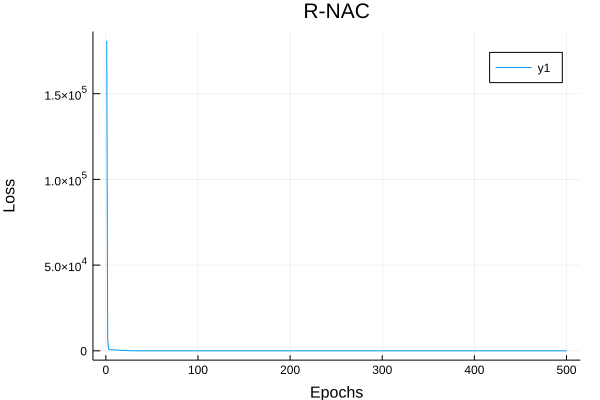

In [58]:
rnac = Chain(RNAC(2, 2), NAC(2, 1))
rnac_opt = ADAM(params(rnac))
rnac_loss = loss(f, rnac)
hist = train_model(rnac_loss, rnac_opt, add_data_train, add_data_val, epochs)
@info "Validation loss", hist[end]
@info "Test loss", Flux.data(sum(rnac_loss(d...) for d in add_data_test) / length(add_data_test))
plot(hist, title="R-NAC", xlabel="Epochs", ylabel="Loss")

## `RNALU`

┌ Info: Iteration 1 - Validation loss = 826465.9786820484
└ @ Main In[56]:15
┌ Info: Iteration 2 - Validation loss = 352415.92460302525
└ @ Main In[56]:15
┌ Info: Iteration 3 - Validation loss = 98554.95601318488
└ @ Main In[56]:15
┌ Info: Iteration 4 - Validation loss = 21671.84262008004
└ @ Main In[56]:15
┌ Info: Iteration 5 - Validation loss = 3913.4933312967783
└ @ Main In[56]:15
┌ Info: Iteration 6 - Validation loss = 1233.5956195806068
└ @ Main In[56]:15
┌ Info: Iteration 7 - Validation loss = 958.4605733183976
└ @ Main In[56]:15
┌ Info: Iteration 8 - Validation loss = 905.9842287559125
└ @ Main In[56]:15
┌ Info: Iteration 9 - Validation loss = 862.4008250177915
└ @ Main In[56]:15
┌ Info: Iteration 10 - Validation loss = 809.3456593223668
└ @ Main In[56]:15
┌ Info: Iteration 11 - Validation loss = 743.258292723005
└ @ Main In[56]:15
┌ Info: Iteration 12 - Validation loss = 664.0489410703459
└ @ Main In[56]:15
┌ Info: Iteration 13 - Validation loss = 577.978143512439
└ @ Main In[5

┌ Info: Iteration 109 - Validation loss = 0.7528993617173874
└ @ Main In[56]:15
┌ Info: Iteration 110 - Validation loss = 0.7443547555427962
└ @ Main In[56]:15
┌ Info: Iteration 111 - Validation loss = 0.7356775131662577
└ @ Main In[56]:15
┌ Info: Iteration 112 - Validation loss = 0.7268322818709352
└ @ Main In[56]:15
┌ Info: Iteration 113 - Validation loss = 0.717783977655555
└ @ Main In[56]:15
┌ Info: Iteration 114 - Validation loss = 0.7084999871011298
└ @ Main In[56]:15
┌ Info: Iteration 115 - Validation loss = 0.698952636115403
└ @ Main In[56]:15
┌ Info: Iteration 116 - Validation loss = 0.6891217352432547
└ @ Main In[56]:15
┌ Info: Iteration 117 - Validation loss = 0.6789969524812376
└ @ Main In[56]:15
┌ Info: Iteration 118 - Validation loss = 0.6685797303786661
└ @ Main In[56]:15
┌ Info: Iteration 119 - Validation loss = 0.6578844689548462
└ @ Main In[56]:15
┌ Info: Iteration 120 - Validation loss = 0.646938748475408
└ @ Main In[56]:15
┌ Info: Iteration 121 - Validation loss = 0

┌ Info: Iteration 211 - Validation loss = 0.10661109518841344
└ @ Main In[56]:15
┌ Info: Iteration 212 - Validation loss = 0.10613862542123226
└ @ Main In[56]:15
┌ Info: Iteration 213 - Validation loss = 0.10566716617728744
└ @ Main In[56]:15
┌ Info: Iteration 214 - Validation loss = 0.10519309427822812
└ @ Main In[56]:15
┌ Info: Iteration 215 - Validation loss = 0.1047131240926977
└ @ Main In[56]:15
┌ Info: Iteration 216 - Validation loss = 0.10422430056696856
└ @ Main In[56]:15
┌ Info: Iteration 217 - Validation loss = 0.1037239899494683
└ @ Main In[56]:15
┌ Info: Iteration 218 - Validation loss = 0.10320986874042981
└ @ Main In[56]:15
┌ Info: Iteration 219 - Validation loss = 0.10267991131377374
└ @ Main In[56]:15
┌ Info: Iteration 220 - Validation loss = 0.10213237659283488
└ @ Main In[56]:15
┌ Info: Iteration 221 - Validation loss = 0.10156579410101305
└ @ Main In[56]:15
┌ Info: Iteration 222 - Validation loss = 0.10097894965384493
└ @ Main In[56]:15
┌ Info: Iteration 223 - Valida

┌ Info: Iteration 313 - Validation loss = 0.12677184170140268
└ @ Main In[56]:15
┌ Info: Iteration 314 - Validation loss = 0.13149338374436312
└ @ Main In[56]:15
┌ Info: Iteration 315 - Validation loss = 0.13622965945043736
└ @ Main In[56]:15
┌ Info: Iteration 316 - Validation loss = 0.14086535949635004
└ @ Main In[56]:15
┌ Info: Iteration 317 - Validation loss = 0.1452272989397431
└ @ Main In[56]:15
┌ Info: Iteration 318 - Validation loss = 0.14905987681364977
└ @ Main In[56]:15
┌ Info: Iteration 319 - Validation loss = 0.15199406216848257
└ @ Main In[56]:15
┌ Info: Iteration 320 - Validation loss = 0.1535142446223148
└ @ Main In[56]:15
┌ Info: Iteration 321 - Validation loss = 0.15293780959036862
└ @ Main In[56]:15
┌ Info: Iteration 322 - Validation loss = 0.14944328301946513
└ @ Main In[56]:15
┌ Info: Iteration 323 - Validation loss = 0.14221320133962262
└ @ Main In[56]:15
┌ Info: Iteration 324 - Validation loss = 0.1307705357870563
└ @ Main In[56]:15
┌ Info: Iteration 325 - Validat

┌ Info: Iteration 417 - Validation loss = 0.04286710554608632
└ @ Main In[56]:15
┌ Info: Iteration 418 - Validation loss = 0.04198802293737434
└ @ Main In[56]:15
┌ Info: Iteration 419 - Validation loss = 0.041091561853804776
└ @ Main In[56]:15
┌ Info: Iteration 420 - Validation loss = 0.040185176008874925
└ @ Main In[56]:15
┌ Info: Iteration 421 - Validation loss = 0.03927575068821155
└ @ Main In[56]:15
┌ Info: Iteration 422 - Validation loss = 0.03836953443620057
└ @ Main In[56]:15
┌ Info: Iteration 423 - Validation loss = 0.03747209805288254
└ @ Main In[56]:15
┌ Info: Iteration 424 - Validation loss = 0.03658831817359504
└ @ Main In[56]:15
┌ Info: Iteration 425 - Validation loss = 0.03572238187195174
└ @ Main In[56]:15
┌ Info: Iteration 426 - Validation loss = 0.03487780830973165
└ @ Main In[56]:15
┌ Info: Iteration 427 - Validation loss = 0.03405748342423648
└ @ Main In[56]:15
┌ Info: Iteration 428 - Validation loss = 0.033263703869458094
└ @ Main In[56]:15
┌ Info: Iteration 429 - V

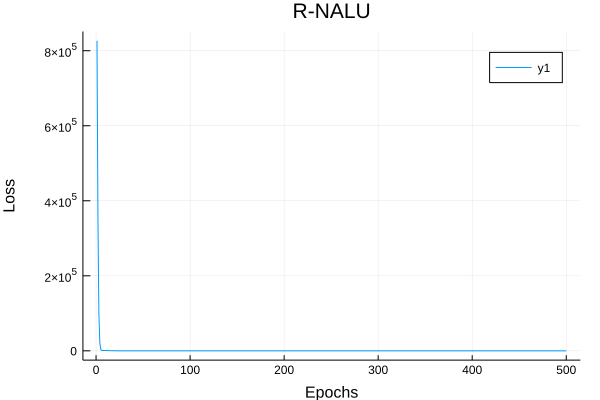

In [60]:
rnalu = Chain(RNALU(2, 2), NALU(2, 1))
rnalu_opt = ADAM(params(rnalu))
rnalu_loss = loss(f, rnalu)
hist = train_model(rnalu_loss, rnalu_opt, add_data_train, add_data_val, epochs)
@info "Validation loss", hist[end]
@info "Test loss", Flux.data(sum(rnalu_loss(d...) for d in add_data_test) / length(add_data_test))
plot(hist, title="R-NALU", xlabel="Epochs", ylabel="Loss")

Notice `RNAC` and `RNALU` both have a significantly lower test loss score than the `LSTM` while the validation scores are similar. This implies `RNAC` and `RNALU` generalize to longer sequences much better than the `LSTM`.